In [19]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/fonseca")

In [8]:
library(Seurat)
library(harmony)
library(ggplot2)
library(openxlsx)

Loading required package: Rcpp



In [21]:
load("/dh-projects/ag-conrad/analysis/saal11/panfib/fonseca/data_fons_merged.RData")

In [22]:
#Updating Seurat object
data_fons <- UpdateSeuratObject(data_fons)

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Warning message:
“Assay RNA changing from Assay to Assay”
Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Updating slots in RNA

Validating object structure for Assay ‘RNA’

Object representation is consistent with the most current Seurat version



In [23]:
#Adding condition
data_fons$condition <- ifelse(data_fons$patientID %in% c("p3", "p6", "p12", "p15"), "control",
                                     "fibrotic-endo")

In [7]:
unique(data_fons$condition)

[1] "fibrotic-endo" "control"

In [24]:
data_fons$fileID <- data_fons$orig.ident

In [25]:
data_fons[["RNA"]] <- split(data_fons[["RNA"]], f = data_fons$fileID)

Warning message:
“Input is a v3 assay and `split()` only works for v5 assays; converting
• to a v5 assay”
Warning message:
“Assay RNA changing from Assay to Assay5”


In [1]:
Layers(data_fons)

ERROR: Error in Layers(data_fons): could not find function "Layers"


In [26]:
#Preparation prior to integration - timed
start.time <- Sys.time()

data_fons <- NormalizeData(data_fons)


data_fons <- FindVariableFeatures(data_fons, selection.method = "vst", nfeatures = 2000)


data_fons <- ScaleData(data_fons,verbose = FALSE)

data_fons <- RunPCA(data_fons, features = VariableFeatures(object = data_fons), npcs = 50)

result <- sum(1:10000)

end.time <- Sys.time()
time.taken <- round(end.time - start.time,2)
time.taken

Normalizing layer: counts.sample1

Normalizing layer: counts.sample5

Normalizing layer: counts.sample6

Normalizing layer: counts.sample7

Normalizing layer: counts.sample8

Normalizing layer: counts.sample9

Normalizing layer: counts.sample10

Normalizing layer: counts.sample11

Normalizing layer: counts.sample12

Normalizing layer: counts.sample13

Normalizing layer: counts.sample14

Normalizing layer: counts.sample15

Normalizing layer: counts.sample16

Normalizing layer: counts.sample17

Normalizing layer: counts.sample18

Normalizing layer: counts.sample19

Normalizing layer: counts.sample20

Normalizing layer: counts.sample21

Normalizing layer: counts.sample22

Normalizing layer: counts.sample23

Normalizing layer: counts.sample24

Normalizing layer: counts.sample25

Normalizing layer: counts.sample26

Normalizing layer: counts.sample27

Normalizing layer: counts.sample28

Normalizing layer: counts.sample29

Normalizing layer: counts.sample30

Normalizing layer: counts.sample31

Time difference of 10.73 mins

In [27]:
#Harmony integration - timed
start.time <- Sys.time()


data_fons <- RunHarmony(data_fons, 
                        group.by.vars = c("fileID", "patientID"),
                        reduction = "pca",
                        lambda = 0.2, #from paper
                        verbose = TRUE,
                        reduction.save = "harmony",
                        assay.use = "RNA")

result <- sum(1:10000)

end.time <- Sys.time()
time.taken <- round(end.time - start.time,2)
time.taken

Transposing data matrix

Initializing state using k-means centroids initialization

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 17133400)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 17133400)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 17133400)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony converged after 8 iterations



Time difference of 9.02 mins

In [28]:
data_fons <- FindNeighbors(data_fons, dims = 1:30, reduction = "harmony")
data_fons <- FindClusters(data_fons, resolution = 0.8)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 342668
Number of edges: 9515048

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9094
Number of communities: 59
Elapsed time: 202 seconds


20 singletons identified. 39 final clusters.



In [29]:
data_fons <- RunUMAP(data_fons, reduction = "harmony", dims = 1:30, reduction.name = "umap.harmony")

10:19:31 UMAP embedding parameters a = 0.9922 b = 1.112

10:19:31 Read 342668 rows and found 30 numeric columns

10:19:31 Using Annoy for neighbor search, n_neighbors = 30

10:19:31 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:20:13 Writing NN index file to temp file /tmp/RtmpOVBZmg/file18a5a55e6c4bb6

10:20:13 Searching Annoy index using 1 thread, search_k = 3000

10:23:03 Annoy recall = 100%

10:23:03 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

10:23:15 Initializing from normalized Laplacian + noise (using RSpectra)

10:24:17 Commencing optimization for 200 epochs, with 16139622 positive edges

10:28:04 Optimization finished



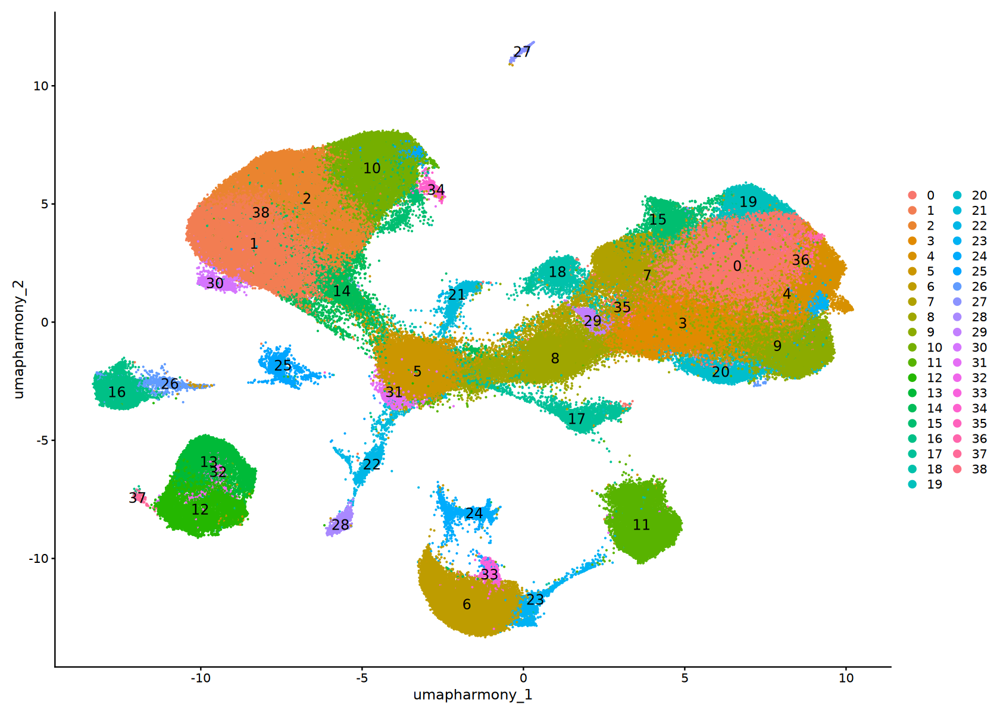

In [31]:
options(repr.plot.width=14, repr.plot.height=10)
DimPlot(data_fons, reduction = "umap.harmony", label = TRUE, pt.size = 0.1, label.size = 5, raster = FALSE)

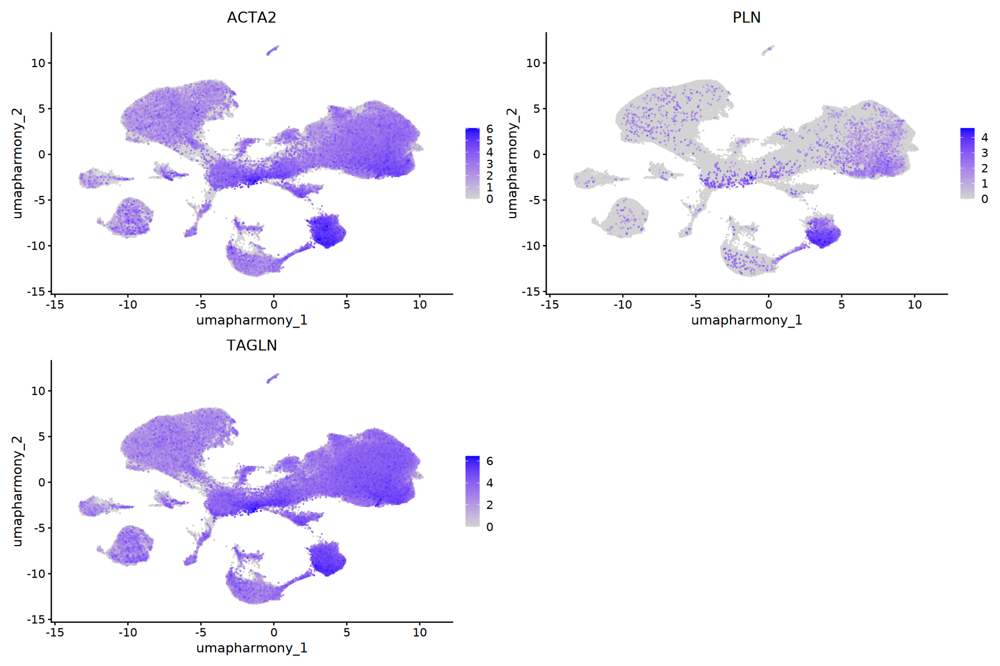

In [33]:
#Annotation of cells - SMCs
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("ACTA2", "PLN", "TAGLN"), raster = FALSE, order = TRUE) 

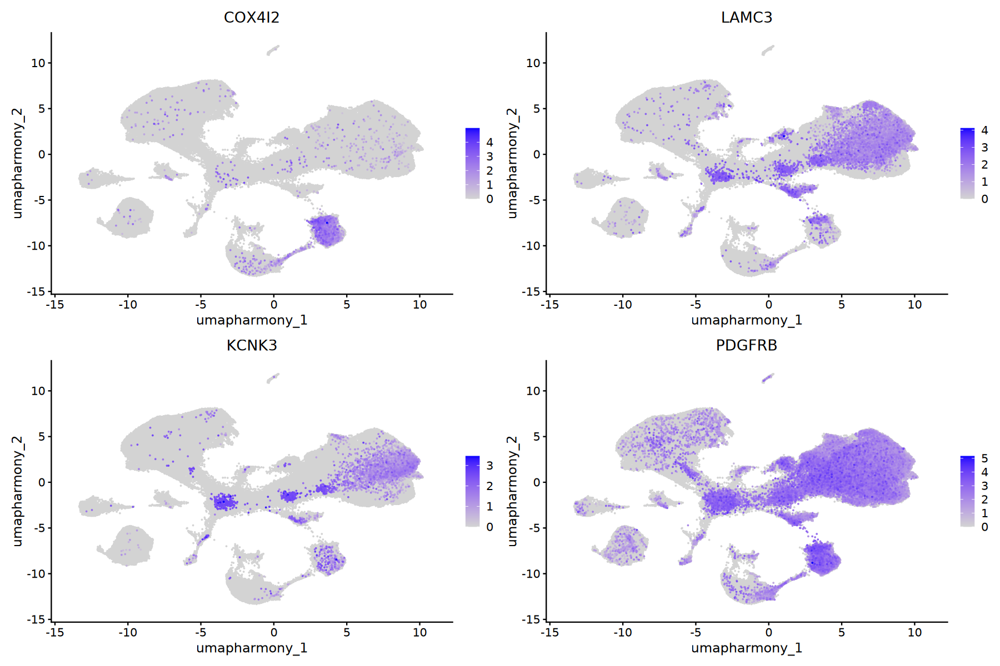

In [35]:
#Annotating - Pericytes
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("COX4I2", "LAMC3", "KCNK3", "PDGFRB"), raster = FALSE, order = TRUE) 

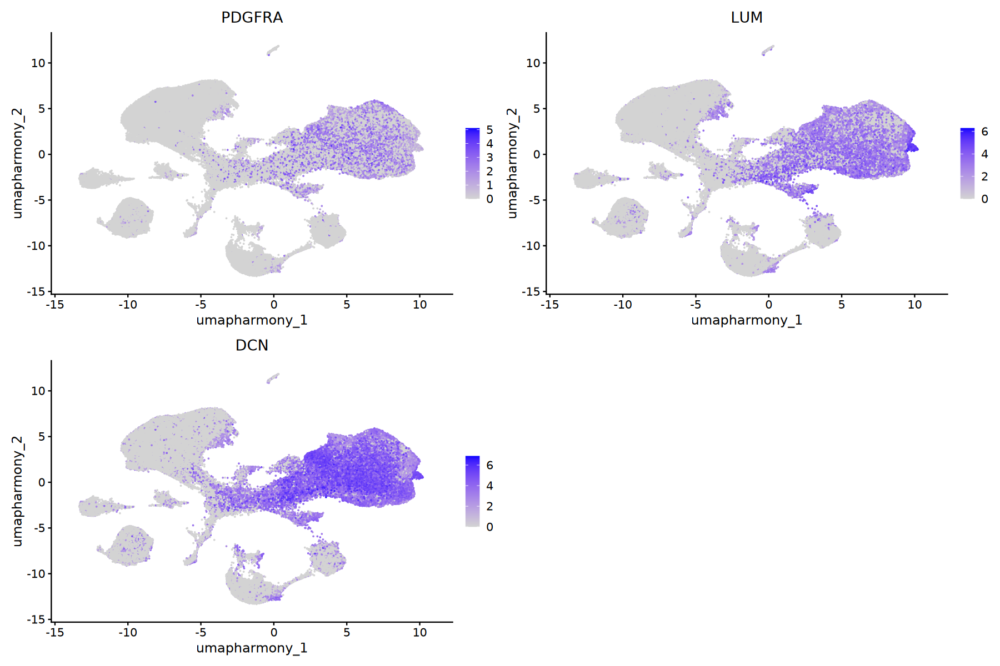

In [39]:
#Annotating - Fibroblasts
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("PDGFRA", "LUM", "DCN"), raster = FALSE, order = FALSE) #Fibroblasts

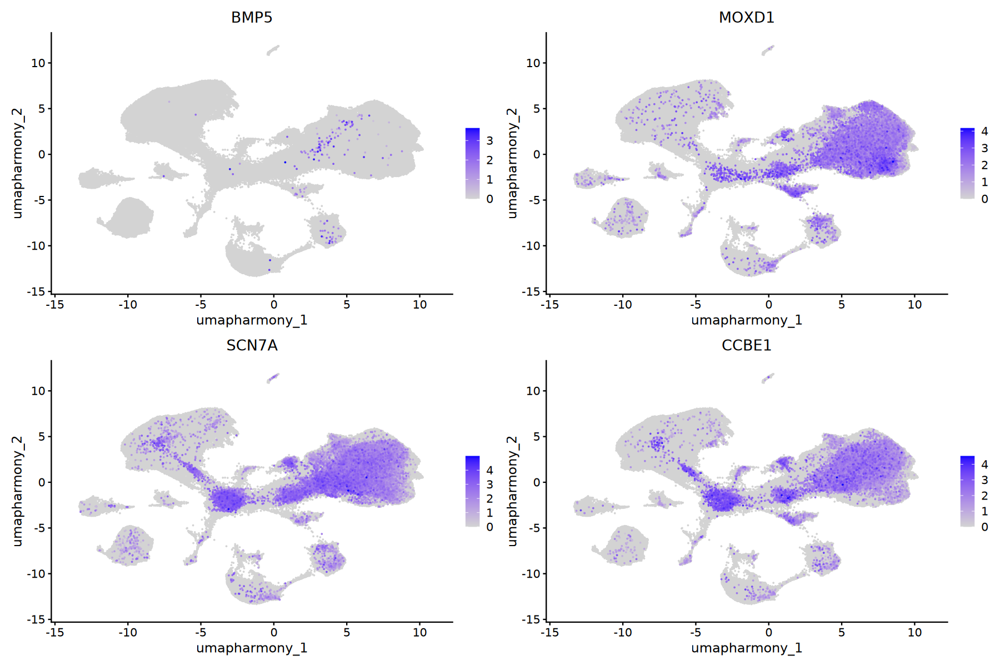

In [37]:
#Annotating - Myofibroblasts
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("BMP5", "MOXD1", "SCN7A", "CCBE1"), raster = FALSE, order = TRUE) #

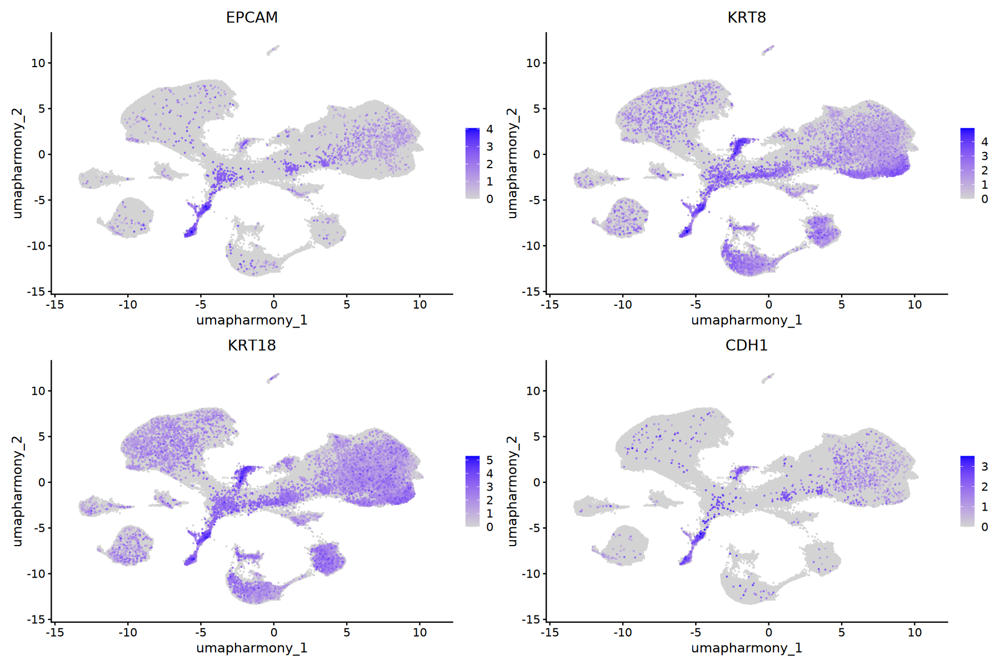

In [38]:
#Annotating - Epi
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("EPCAM", "KRT8", "KRT18", "CDH1"), raster = FALSE, order = TRUE) 

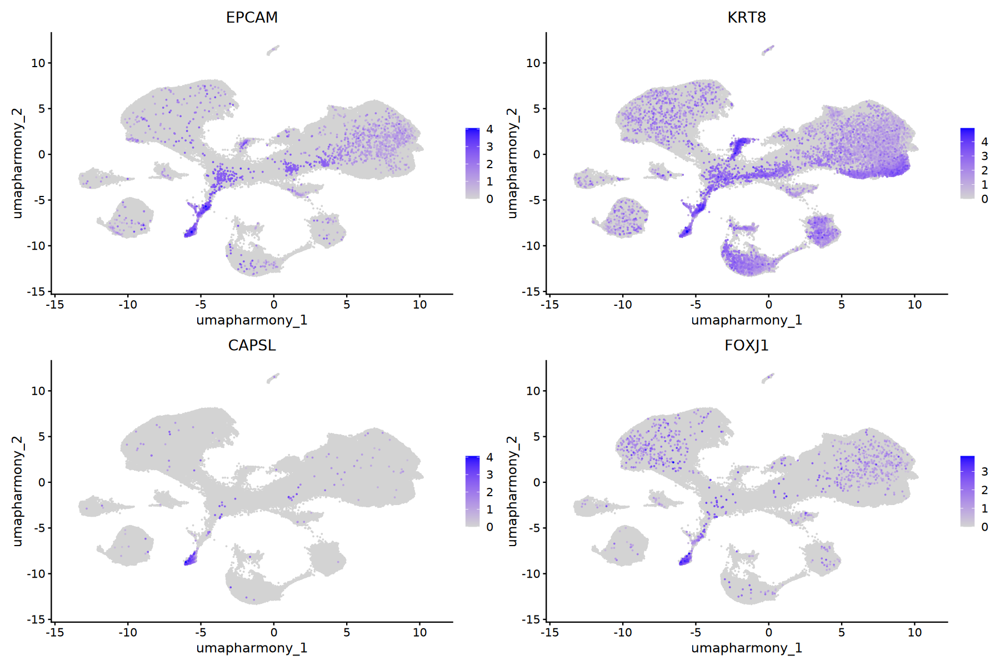

In [40]:
#Annotating - Ciliated cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("EPCAM", "KRT8", "CAPSL", "FOXJ1"), raster = FALSE, order = TRUE) 

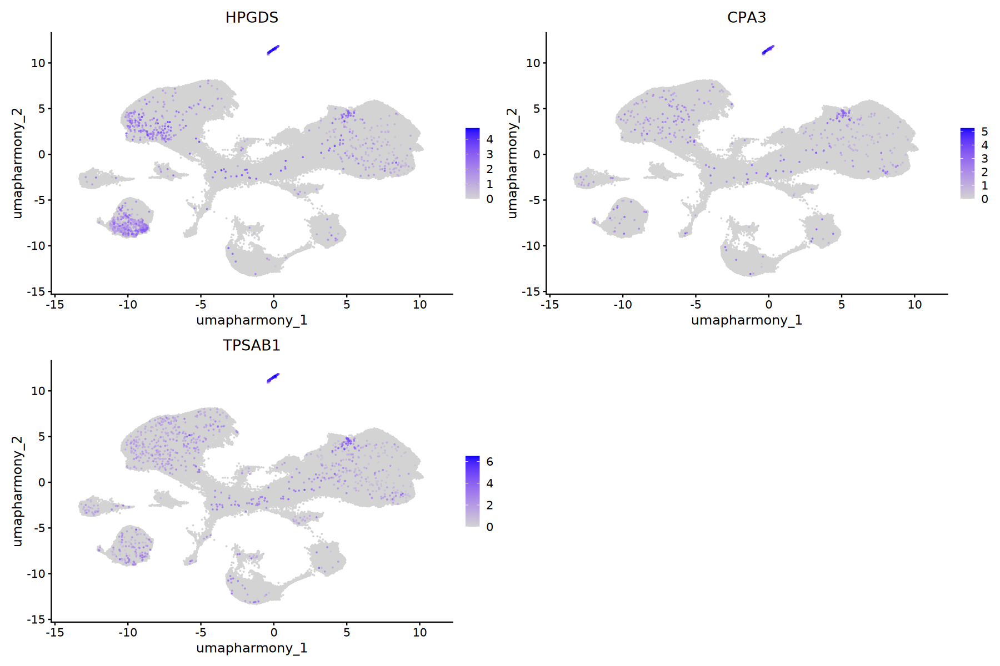

In [41]:
#Annotating - Mast cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("HPGDS", "CPA3", "TPSAB1"), raster = FALSE, order = TRUE) 

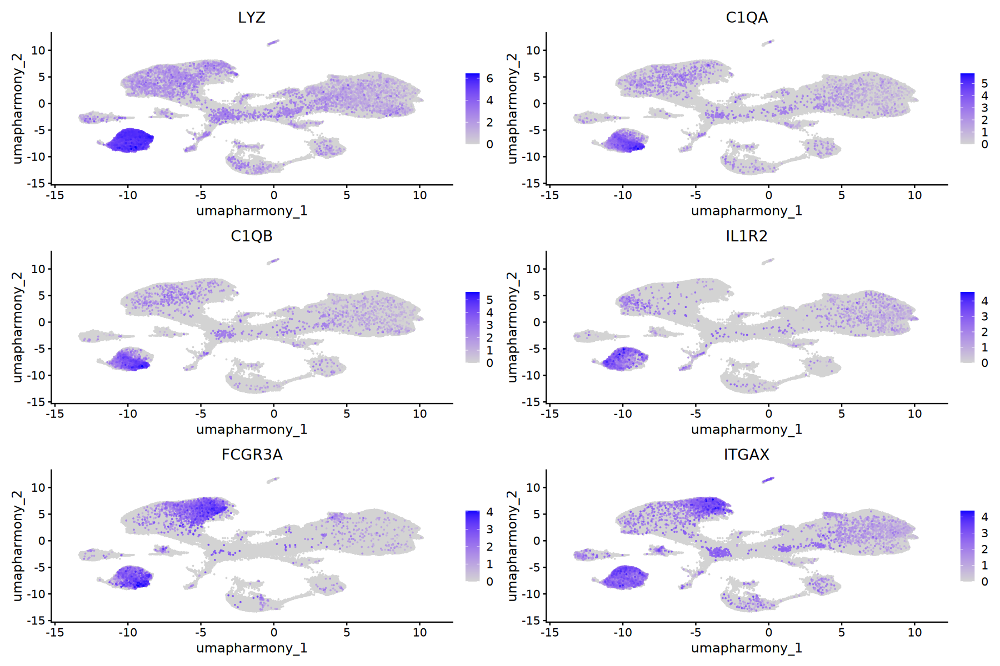

In [42]:
#Annotating - Macrophages cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("LYZ", "C1QA", "C1QB", "IL1R2", "FCGR3A", "ITGAX"), raster = FALSE, order = TRUE)

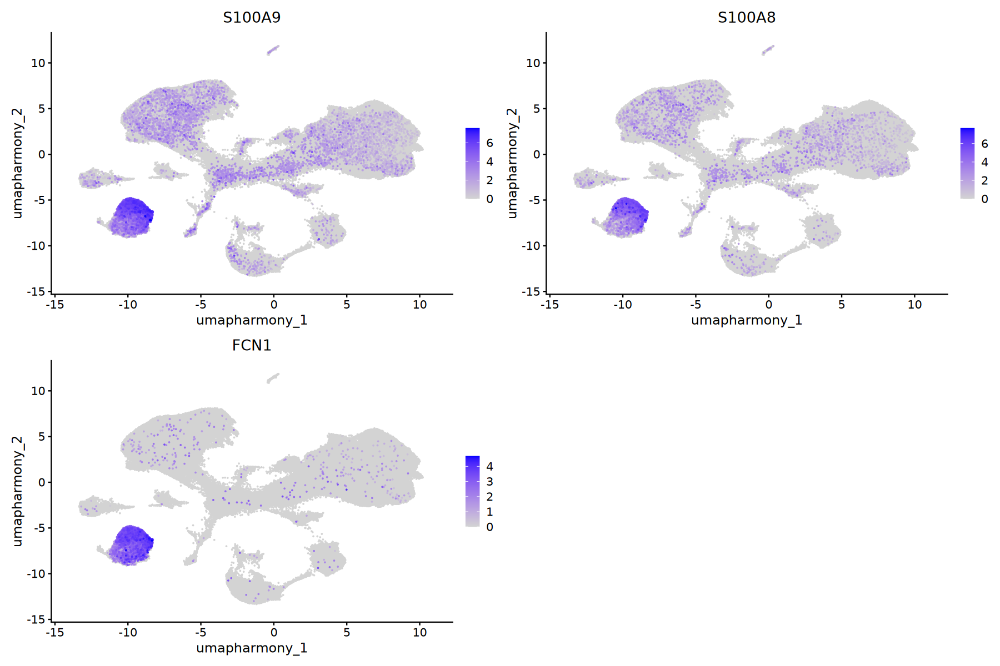

In [43]:
#Annotating - Monocytes cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("S100A9", "S100A8", "FCN1"), raster = FALSE, order = TRUE) 

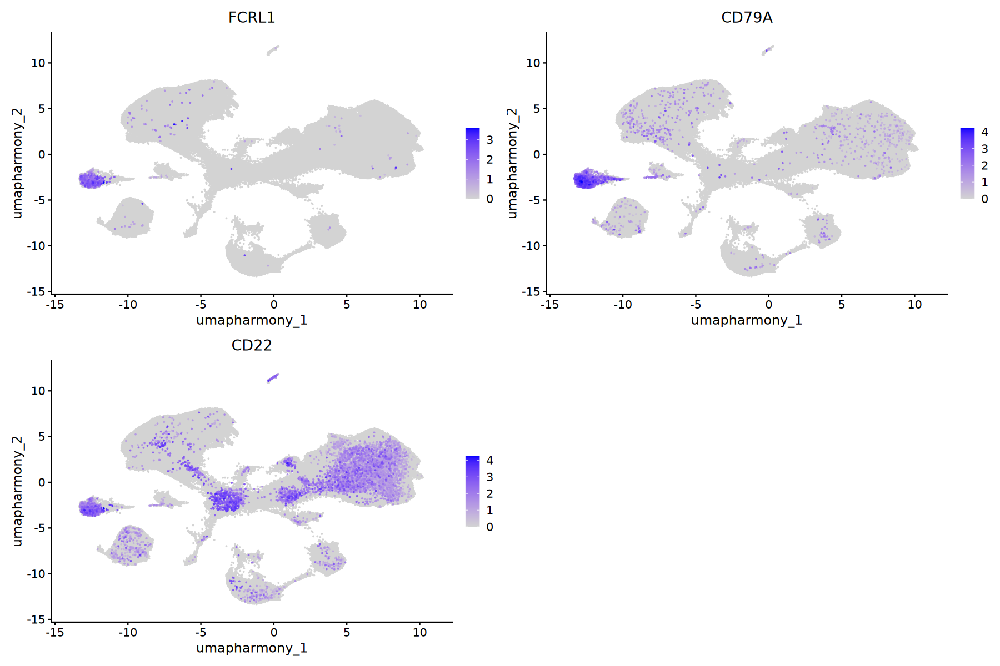

In [44]:
#Annotating - B cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("FCRL1", "CD79A", "CD22"), raster = FALSE, order = TRUE) #B cells

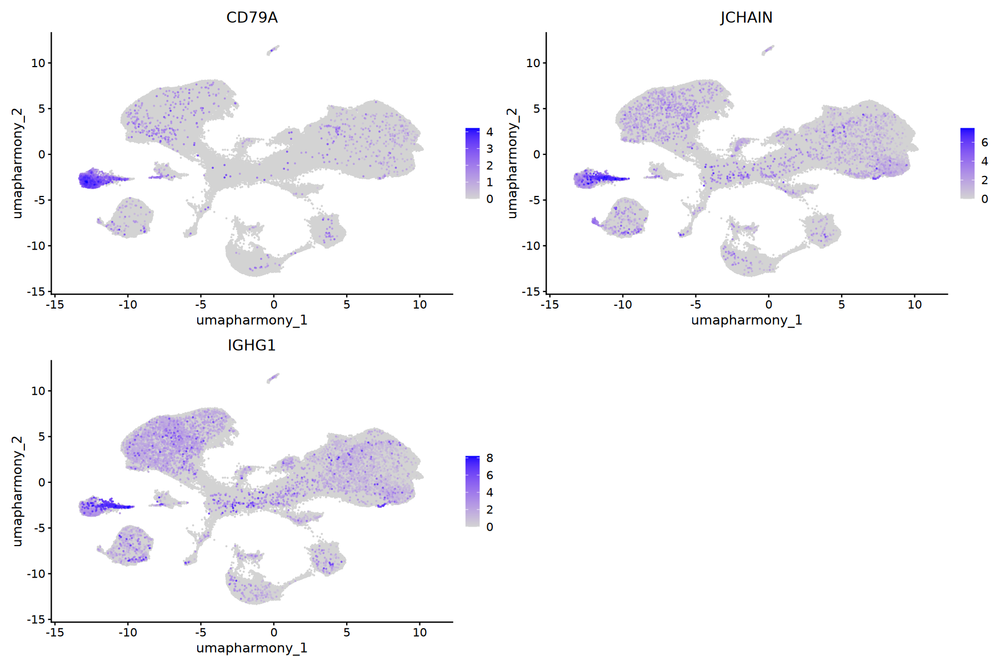

In [45]:
#Annotating -  Plasma cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("CD79A", "JCHAIN", "IGHG1"), raster = FALSE, order = TRUE) #Plasma cells

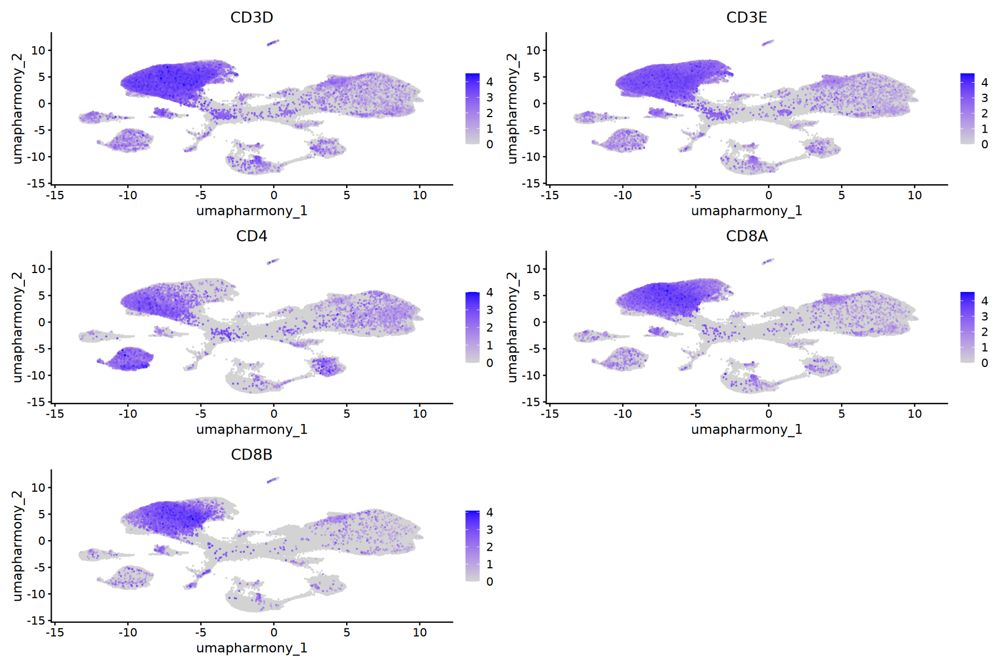

In [46]:
#Annotating - T cells
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("CD3D", "CD3E","CD4", "CD8A", "CD8B"), raster = FALSE, order =  TRUE) #T cells

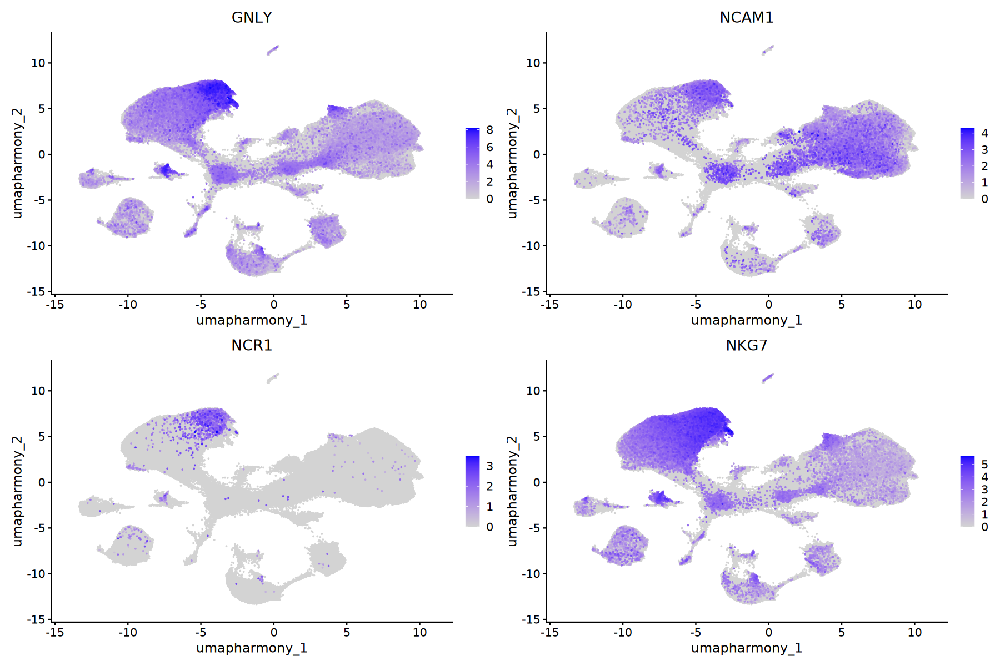

In [47]:
#Annotating - NK
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("GNLY", "NCAM1", "NCR1", "NKG7"), raster = FALSE, order = TRUE)#NK cells

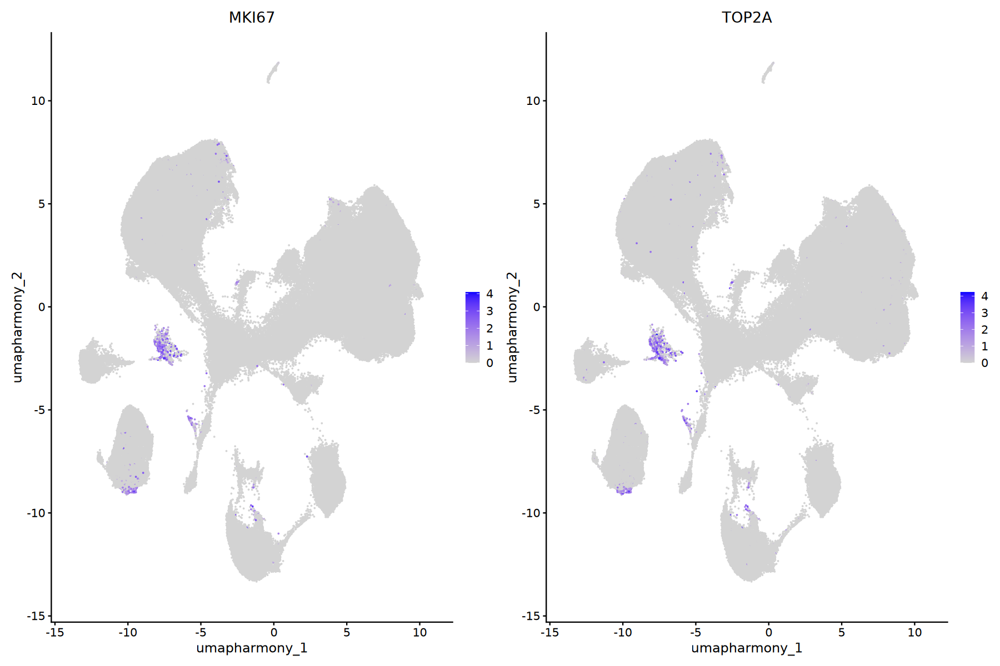

In [48]:
#Annotating - Mitotic
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("MKI67", "TOP2A"), raster = FALSE) #Mitotic cells

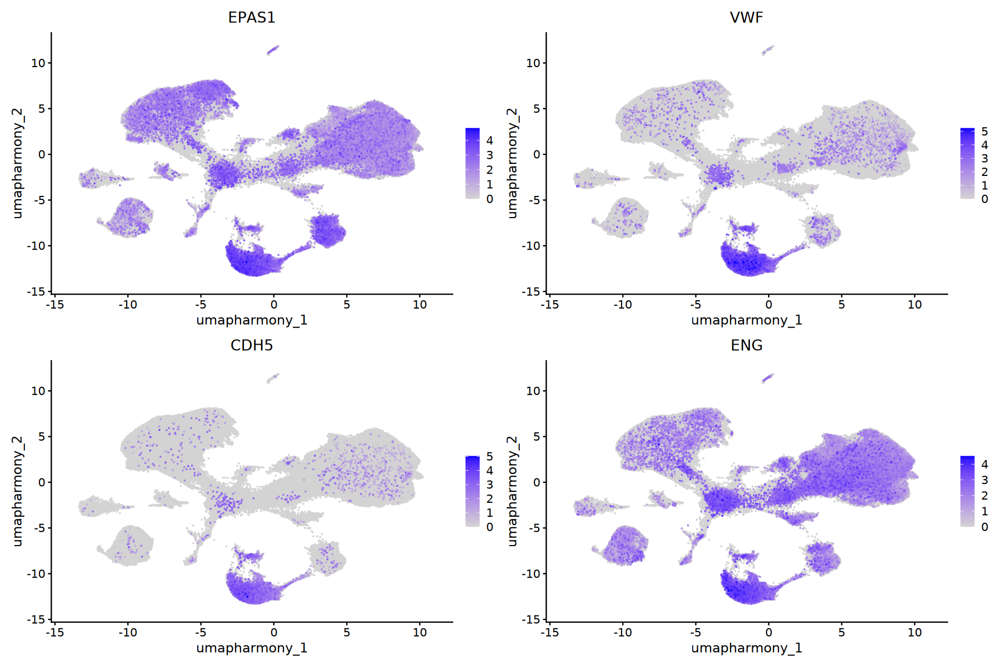

In [49]:
#Annotating - Endo
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("EPAS1", "VWF", "CDH5", "ENG"), raster = FALSE, order = TRUE) #Endo cells

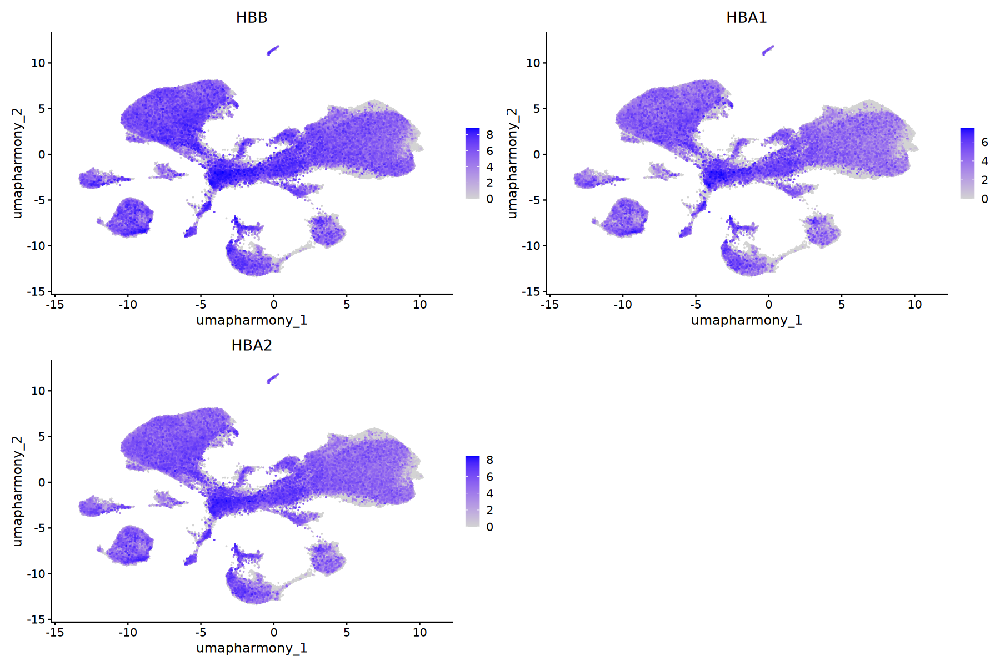

In [51]:
#Annotating - Eythrocytes
options(repr.plot.width=15, repr.plot.height=10) 
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("HBB", "HBA1", "HBA2"), raster = FALSE, order = TRUE) 

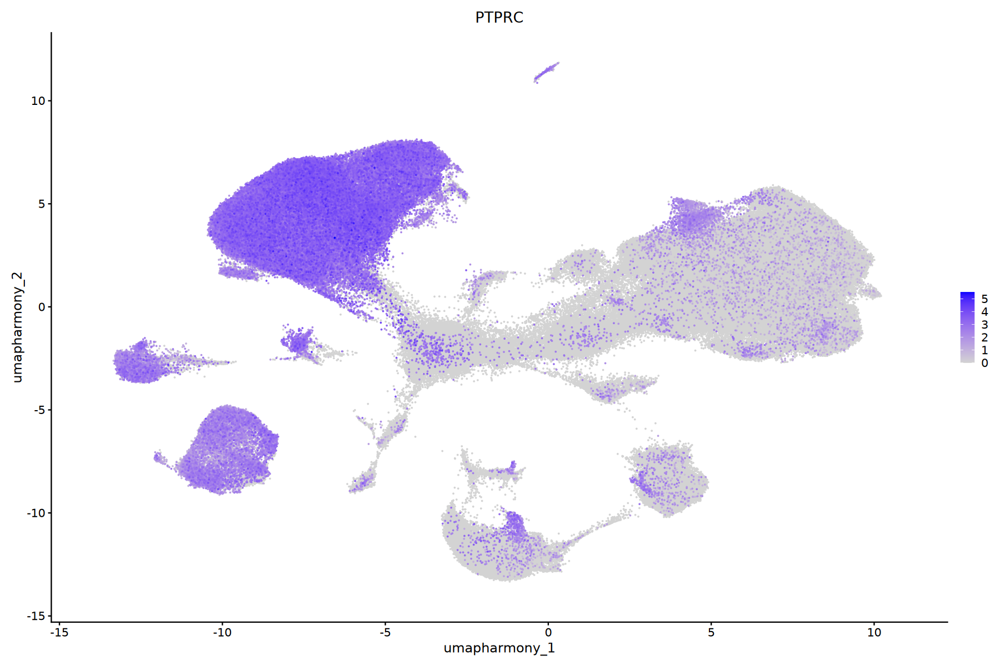

In [52]:
#Annotating - Imm
options(repr.plot.width=15, repr.plot.height=10) 
FeaturePlot(data_fons, reduction = "umap.harmony", features = c("PTPRC"), raster = FALSE, order = TRUE) 

In [89]:
data_fons <- JoinLayers(data_fons)

In [94]:
data_fons@assays

$RNA
Assay (v5) data with 28668 features for 342668 cells
Top 10 variable features:
 CXCL8, IL1B, HBB, CCL20, S100A9, CCL3, HLA-DRA, LYZ, CCL4, CCL4L2 
Layers:
 data, counts, scale.data 


In [109]:
#Markers of 36
library(future)
plan("multicore", workers = 6)
cls36 <- FindMarkers(data_fons, ident.1 = 36, ident.2 = c(1, 2, 3), logfc.threshold = 1)

In [110]:
cls36$genes <- rownames(cls36)
write.xlsx(cls36, "data_fons_cluster36_vsTcells.xlsx") 

In [111]:
#Markers of 36
library(future)
plan("multicore", workers = 6)
cls29 <- FindMarkers(data_fons, ident.1 = 29, idemt.2 = c(34, 14), logfc.threshold = 1)

In [112]:
cls29$genes <- rownames(cls29)
write.xlsx(cls29, "data_fons_cluster29_vsNK.xlsx") 

In [155]:
load("data_fons_integrated.RData")

In [156]:
levels(data_fons$`RNA_snn_res.0.8`)

[1] "0"  "1"  "10" "11" "12" "13" "14" "15" "16" "17" "18" "19" "2"  "20" "21"
[16] "22" "23" "24" "25" "26" "27" "28" "29" "3"  "30" "31" "32" "33" "34" "35"
[31] "36" "37" "38" "39" "4"  "40" "41" "42" "5"  "6"  "7"  "8"  "9"

In [54]:
#Rearrange cells order
#Check the current levels of cell_identity
levels(data_fons$`RNA_snn_res.0.8`)

# Define the desired order of factor levels
desired_order <- c("0", "1", "2", "3", "4", "5", "6", "7",
                   "8", "9", "10", "11", "12", "13", "14",
                   "15", "16", "17", "18",  "19", "20", "21", "22", "23", "24", "25",  "26", "27", "28", "29", "30",
                  "31", "32", "33", "34",  "35", "36", "37", "38")

# Reorder the factor levels
data_fons$`RNA_snn_res.0.8` <- factor(data_fons$`RNA_snn_res.0.8`, levels = desired_order)

# Check if the factor levels have been reordered
levels(data_fons$`RNA_snn_res.0.8`)

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17" "18" "19" "20" "21" "22" "23" "24" "25" "26" "27" "28" "29"
[31] "30" "31" "32" "33" "34" "35" "36" "37" "38" "39" "40" "41" "42"

[1] "0"  "1"  "2"  "3"  "4"  "5"  "6"  "7"  "8"  "9"  "10" "11" "12" "13" "14"
[16] "15" "16" "17" "18" "19" "20" "21" "22" "23" "24" "25" "26" "27" "28" "29"
[31] "30" "31" "32" "33" "34" "35" "36" "37" "38"

Warning message:
“Cannot find cell-level meta data named  cells”
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



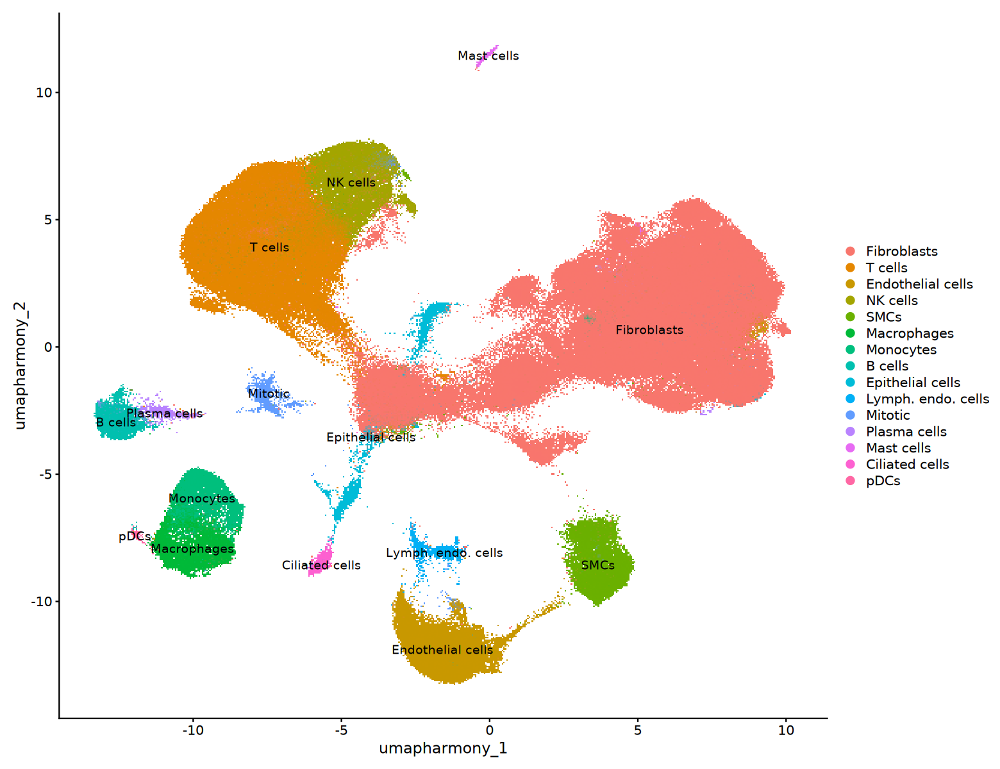

In [55]:
#Assigning new names
data_fons$cells <- NULL
data_fons@active.ident <- factor(data_fons$`RNA_snn_res.0.8`)

cluster.ids.new <- c("Fibroblasts", "T cells", "T cells", "Fibroblasts", "Fibroblasts", "Fibroblasts", 
                     "Endothelial cells", "Fibroblasts", "Fibroblasts", "Fibroblasts", "NK cells", "SMCs", 
                     "Macrophages", "Monocytes", "T cells", "Fibroblasts", "B cells", "Fibroblasts", 
                     "Fibroblasts", "Fibroblasts", "Fibroblasts", "Epithelial cells", "Epithelial cells", 
                     "Endothelial cells", "Lymph. endo. cells", "Mitotic", "Plasma cells", "Mast cells", 
                     "Ciliated cells", "Fibroblasts", "T cells", "Fibroblasts", "Monocytes", 
                     "Endothelial cells", "NK cells", "Fibroblasts", "Fibroblasts", "pDCs", "T cells"
)

names(cluster.ids.new) <- levels(data_fons)
data_fons <- RenameIdents(data_fons, cluster.ids.new)
options(repr.plot.width=13, repr.plot.height=10)
DimPlot(data_fons, reduction = "umap.harmony", label = TRUE)
data_fons$cells <- data_fons@active.ident

In [161]:
unique(data_fons$cells)

[1] T cells            B cells            Fibroblasts        Macrophages       
 [5] NK cells           Monocytes          Endothelial cells  SMCs              
 [9] Plasma cells       Mitotic            Epithelial cells   Ciliated cells    
[13] Mast cells         Lymph. endo. cells pDCs              
15 Levels: Fibroblasts T cells Endothelial cells SMCs NK cells ... pDCs

In [56]:
#Rearrange cells order
#Check the current levels of cell_identity
levels(data_fons$cells)

# Define the desired order of factor levels
desired_order <- c("Endothelial cells", "Fibroblasts", "Lymph. endo. cells", "SMCs", 
                   "Ciliated cells", "Epithelial cells", 
                   "Macrophages", "Monocytes", "Mast cells",  "pDCs",  "B cells", "Plasma cells", "T cells", "NK cells", "Mitotic")

# Reorder the factor levels
data_fons$cells <- factor(data_fons$cells, levels = desired_order)

# Check if the factor levels have been reordered
levels(data_fons$cells)

[1] "Fibroblasts"        "T cells"            "Endothelial cells" 
 [4] "NK cells"           "SMCs"               "Macrophages"       
 [7] "Monocytes"          "B cells"            "Epithelial cells"  
[10] "Lymph. endo. cells" "Mitotic"            "Plasma cells"      
[13] "Mast cells"         "Ciliated cells"     "pDCs"

[1] "Endothelial cells"  "Fibroblasts"        "Lymph. endo. cells"
 [4] "SMCs"               "Ciliated cells"     "Epithelial cells"  
 [7] "Macrophages"        "Monocytes"          "Mast cells"        
[10] "pDCs"               "B cells"            "Plasma cells"      
[13] "T cells"            "NK cells"           "Mitotic"

In [3]:
cellytpe_colors <- c(
    "Endothelial cells" = "#f9c7be",
  "Fibroblasts" = "#e65c6f",
  "Lymph. endo. cells" = "#f98d77",
    "SMCs" = "#bd4545",
    "Epithelial cells" = "#574177",
    "Ciliated cells" = "#ef94ca",
    "Macrophages" = "#096192",
    "Monocytes" = "#1399c6",
    "Mast cells" = "#879eb0",
     "pDCs" = "#4d5d53",
    "B cells" = "#beccc0",
  "Plasma cells" = "#7e9278",
    "T cells" = "#1d817e",
    "NK cells" = "#56beba",
    "Mitotic" = "#6d1950"
)

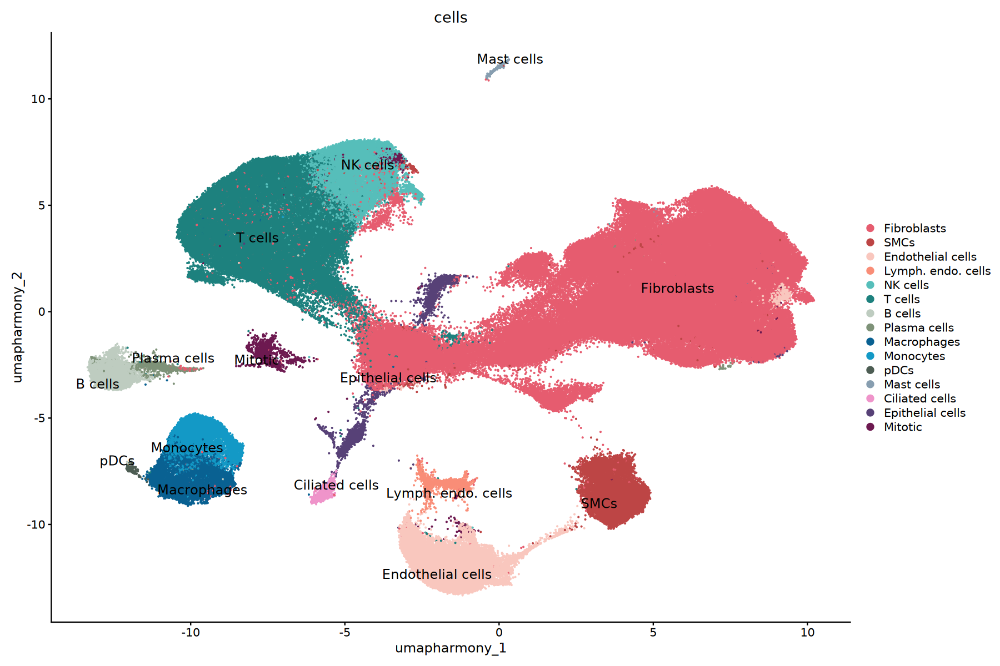

In [6]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(data_fons, reduction = "umap.harmony", cols = cellytpe_colors,  label = TRUE, repel = TRUE, group.by = "cells",pt.size = 0.1, label.size = 5, raster = FALSE)

In [10]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Figures")
p <- DimPlot(data_fons, reduction = "umap.harmony", cols = cellytpe_colors,  label = TRUE, repel = TRUE, group.by = "cells",pt.size = 0.1, label.size = 5, raster = FALSE)
ggsave("data_fons_umap_celltype.png", plot = p, width = 13, height = 10)

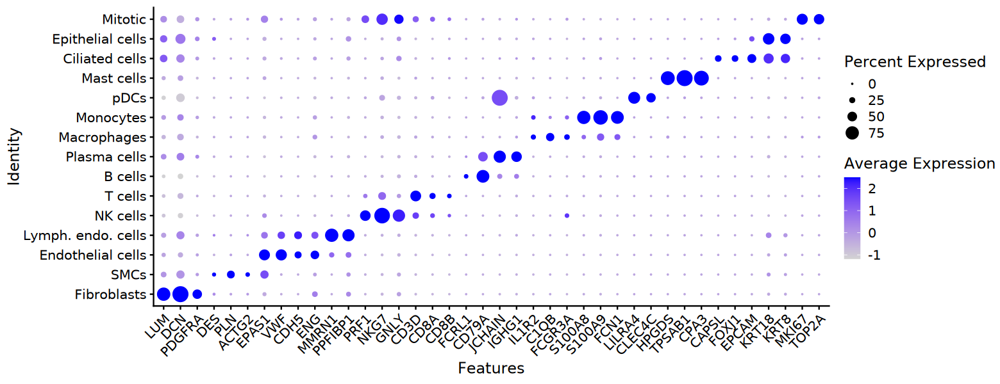

In [61]:
#Dotplotting
data_fons@active.ident <- factor(data_fons$cells)
data_fons$cells <- factor(data_fons$cells, levels = c(       'Fibroblasts', 'SMCs',
                                                             'Endothelial cells', 'Lymph. endo. cells',
                                                             'NK cells', 'T cells',
                                                             'B cells', 'Plasma cells', 
                                                             'Macrophages',  'Monocytes','pDCs', 
                                                             'Mast cells',
                                                             'Ciliated cells','Epithelial cells',
                                                             'Mitotic'))
data_fons@active.ident <- data_fons$cells

features <- c("LUM", "DCN", "PDGFRA", "DES", "PLN", "ACTG2",
              "EPAS1", "VWF", "CDH5", "ENG", "MMRN1", "PPFIBP1",
               "PRF1", "NKG7", "GNLY", "CD3D", "CD8A", "CD8B",
              "FCRL1", "CD79A", "JCHAIN", "IGHG1",
              "IL1R2", "C1QB", "FCGR3A", "S100A8", "S100A9", "FCN1", "LILRA4", "CLEC4C",
              "HPGDS", "TPSAB1", "CPA3",
              "CAPSL", "FOXJ1", "EPCAM", "KRT18", "KRT8",
              "MKI67", "TOP2A"
             ) 
options(repr.plot.width=13, repr.plot.height=5)
DotPlot(data_fons, features = features, group.by = "cells") + RotatedAxis()

In [62]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Figures")
p <- DotPlot(data_fons, features = features, group.by = "cells") + RotatedAxis()
ggsave("data_fons_dotplot_celltype.pdf", plot = p, width = 13, height = 5)

In [170]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Figures")
save(data_fons, file = "data_fons_ann.RData")

In [8]:
unique(data_fons$cells)

[1] T cells            B cells            Fibroblasts        Macrophages       
 [5] NK cells           Monocytes          Endothelial cells  SMCs              
 [9] Plasma cells       Mitotic            Epithelial cells   Ciliated cells    
[13] Mast cells         Lymph. endo. cells pDCs              
15 Levels: Endothelial cells Fibroblasts Lymph. endo. cells ... Mitotic

In [63]:
data_fons$lineage <- 
ifelse(data_fons$cells %in% c("Endothelial cells", "Fibroblasts", "Lymph. endo. cells", "SMCs"), "Mesen",
ifelse(data_fons$cells %in% c("Ciliated cells", "Epithelial cells"), "Epi",
ifelse(data_fons$cells %in% c("Macrophages", "Monocytes", "Mast cells", "pDCs", "B cells", "Plasma cells", "T cells", "NK cells"), "Imm",
ifelse(data_fons$cells %in% c("Mitotic"), "Mitotic",   "ERR"   ))))

In [64]:
#Rearrange cells order
#Check the current levels of cell_identity
levels(data_fons$lineage)

# Define the desired order of factor levels
desired_order <- c("Mesen", "Epi", "Imm", "Mitotic")

# Reorder the factor levels
data_fons$lineage <- factor(data_fons$lineage, levels = desired_order)

# Check if the factor levels have been reordered
levels(data_fons$lineage)

NULL

[1] "Mesen"   "Epi"     "Imm"     "Mitotic"

In [8]:
lineage_colors <- c(
  "Epi" = "#d0c3f1",
  "Imm" = "#096192",
  "Mesen" = "#bc7a80",
    "Mitotic" = "#6d1950"
)

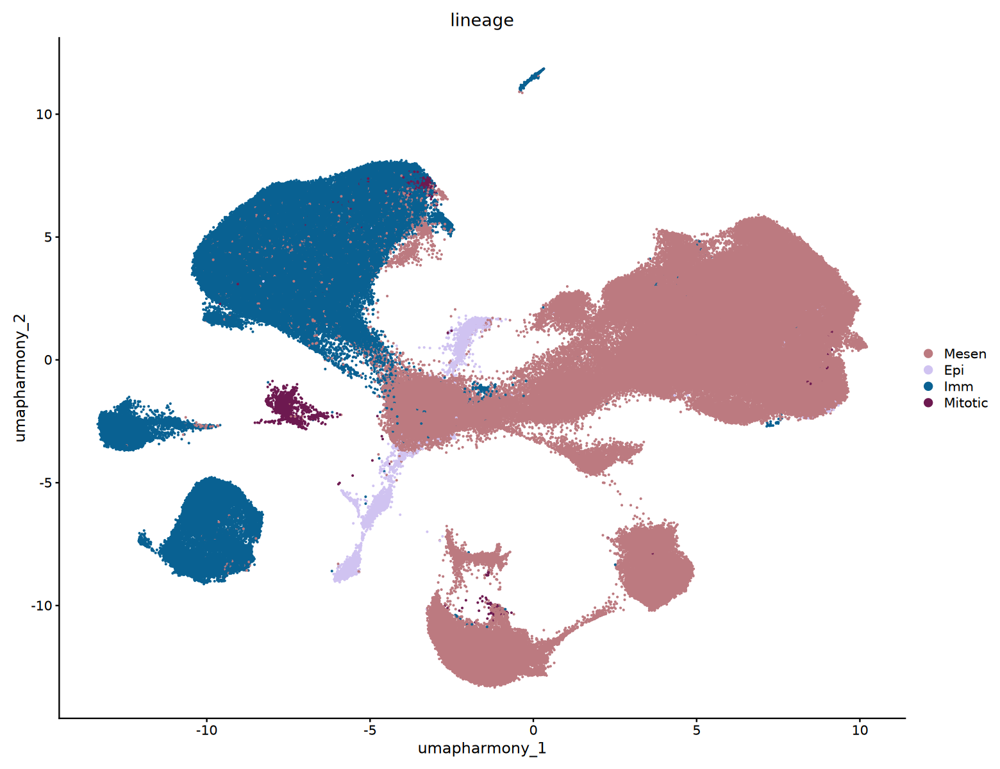

In [11]:
options(repr.plot.width=13, repr.plot.height=10)
DimPlot(data_fons, reduction = "umap.harmony", cols = lineage_colors,  label = FALSE, repel = TRUE, group.by = "lineage",pt.size = 0.1, label.size = 5, raster = FALSE)

In [2]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Datasets_final")
load("data_fons_harm_updated_int_ann.RData")

In [71]:
setwd("/dh-projects/ag-conrad/analysis/saal11/panfib/Datasets_final")
save(data_fons , file = "data_fons_harm_updated_int_ann.RData")